In [1]:
import Pkg; Pkg.add("ForwardDiff");
using Plots, LinearAlgebra, Statistics


  Updating registry at `C:\Users\mahdi\.julia\registries\General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
 Resolving package versions...
  Updating `C:\Users\mahdi\.julia\environments\v1.0\Project.toml`
  [f6369f11] + ForwardDiff v0.9.0
  Updating `C:\Users\mahdi\.julia\environments\v1.0\Manifest.toml`
  [9e28174c] + BinDeps v0.8.10
  [bbf7d656] + CommonSubexpressions v0.2.0


  [163ba53b] + DiffResults v0.0.3
  [b552c78f] + DiffRules v0.0.7
  [f6369f11] + ForwardDiff v0.9.0
  [276daf66] + SpecialFunctions v0.7.1
  [30578b45] + URIParser v0.4.0


# Mahdi Ebrahimi Kahou: Assignment 4

## Question 7

### Defining Functions

This function generates the random walk data with 
$x_{t+1}=\alpha x_{t}+ \sigma \epsilon _{t}$

In [39]:
function drunkard(α,σ)
    steps=100
  error =σ*randn(steps)
  y=ones(steps+1)  
    for t in eachindex(error)
        y[t+1]= α*y[t] + error[t]
    end
    y[steps+1]=0.0
return y
end

drunkard (generic function with 1 method)

This part is just for impressing the reader, it plots a fancy "stock market" looking time series. The question didnt ask for this. The red line is zero.

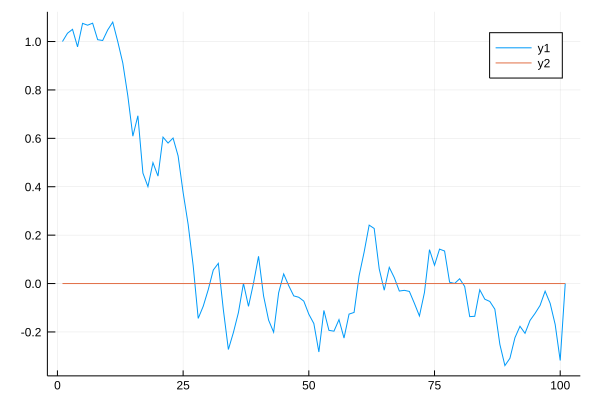

In [87]:
test=drunkard(1.0,0.1)
zerr=zeros(101)
plot([test,zerr])

This is a function which takes an array $y$, and if $y(i)<a$  it assigns zero and and one otherwise. $a$ should be float  

In [42]:
function positivenegative(y,a)

    r=fill(0, size(y))
    for i in eachindex(y)  
    y[i] <= a ? r[i] = 0 : r[i] = 1 
    end
        return r
end

positivenegative (generic function with 1 method)

This function finds the first zero in any given  array

In [53]:
function fptime(z,a)
    auxx=positivenegative(z,a)
    g(x)=x==a
    (ta,nonsense)=findmin(findall(g,auxx))
    return ta-1
end

fptime (generic function with 1 method)

## Question 7.1

Here we generate 100 random walks (drunkard's walk) and find the smallest step sucht that $T_a=\min_{t\in 100}\{t|x_t\leq 0\}$

In [60]:
iter=100
α=1.0
σ=0.1
a=0.0
T=zeros(iter)
for i in eachindex(T)
    randwalkone=drunkard(α,σ)
    T[i]=fptime(randwalkone,a) 
end

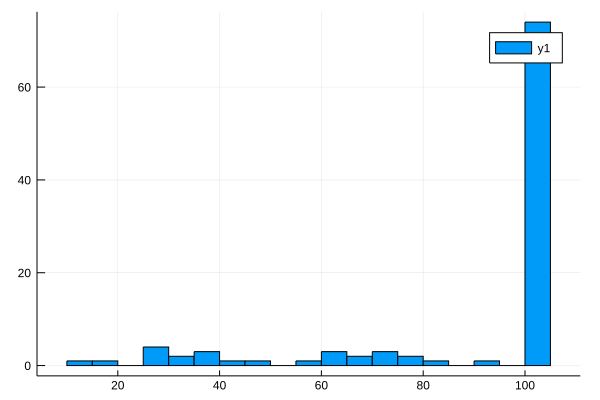

In [61]:
histogram(T)

## Question 7.2

In [80]:
function meanfptime(α,σ,a,iter)
T_two=zeros(iter)
for i in eachindex(T_two)
    randwalkone=drunkard(α,σ)
    T_two[i]=fptime(randwalkone,a) 
end
    return mean(T_two)
end

meanfptime (generic function with 2 methods)

There are two ways that this can be done, first is through a scatter plot. Second, since we defined $T_0(\alpha)$ we can ask Julia to plot this graph for $\alpha\in[0.25,1.5]$ with a high iteration number (I put iter=1000)

### Method I: for discrete $\alpha$

In [95]:
α_two=[0.25,0.5,0.75,1.0,1.25,1.5]

results_two= meanfptime.(α_two,0.1,0.0,100)

6-element Array{Float64,1}:
   4.0 
   5.65
  11.52
  85.03
 100.0 
 100.0 

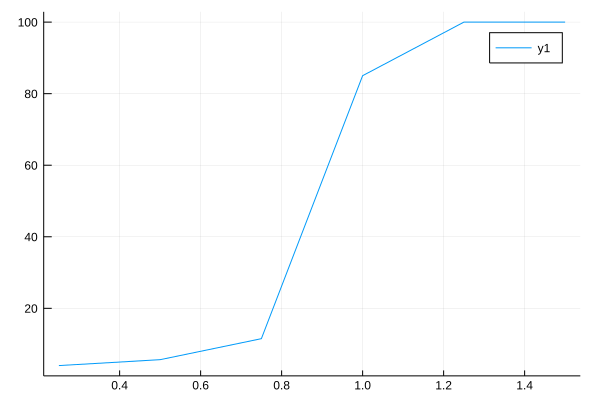

In [104]:
graphpoint = [
  "x" => α_two,
  "y" => results_two,
  "type" => "scatter"
]
 plot(α_two,results_two)

### Method II : for continuous $\alpha$ 

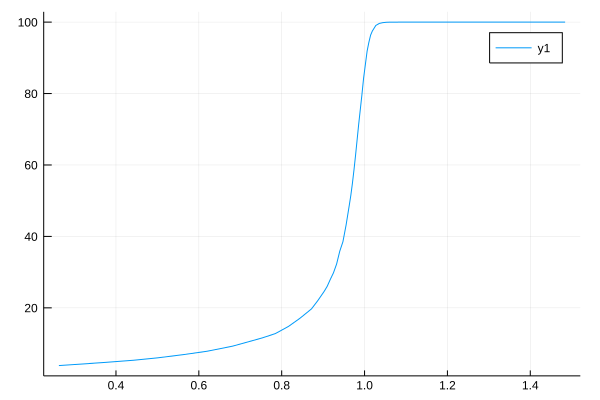

In [100]:
 s(α)=meanfptime(α,0.1,0.0,10000)
plot(s, 0.25, 1.5)







# Question  8

## Question 8.a

In [51]:
function fixedpointmap(f, f_prime, initial_v, tolerance, maxiter)
    x_old = initial_v
    error = Inf
    iter = 1
    while error > tolerance && iter <= maxiter
        x_new =x_old-  (f(x_old)/f_prime(x_old)) 
        error = norm(x_new - x_old)
        x_old = x_new
        iter = iter + 1
    end
    return (x_old, error, iter)
end

# DEF : Functions
f(v)= (v-1)^3
f_prime(v)= 3*(v-1)^2

maxiter = 1000
tolerance = 1.0E-9
# Initial Condition
initial_v = 0.3 

v_star, error, iter = fixedpointmap(f, f_prime, initial_v, tolerance, maxiter)
println("Fixed point = $v_star, and |f(x) - x| = $error in $iter iterations")

Fixed point = 0.999999998353255, and |f(x) - x| = 8.233724813067056e-10 in 50 iterations


## Question 8.b

In [52]:
using ForwardDiff
function fixedpointmap(f, initial_v, tolerance, maxiter)
    x_old = initial_v
    error = Inf
    iter = 1
    D(f) = x -> ForwardDiff.derivative(f, x)
    fprime= D(f)
    while error > tolerance && iter <= maxiter
        x_new =x_old-  (f(x_old)/fprime(x_old)) 
        error = norm(x_new - x_old)
        x_old = x_new
        iter = iter + 1
    end
    return (x_old, error, iter)
end

# DEF : Functions
f(v)= (v)^4-v^3

maxiter = 1000
tolerance = 1.0E-9
# Initial Condition
initial_v = 0.9

v_star, error, iter = fixedpointmap(f, initial_v, tolerance, maxiter)
println("Fixed point = $v_star, and |f(x) - x| = $error in $iter iterations")

Fixed point = 1.0, and |f(x) - x| = 4.6629367034256575e-15 in 7 iterations
